# Домашнее задание 3. Детекция объектов

Сыграем в квиддич? Или лучше в карты?

В этом дз вам предстоит написать практически с нуля архитектуру для детекции, а также воспользоваться готовым решением. На выбор даётся два датасета, отличаются они только картинками. Форматы, баллы - все одинаково.

Первый вариант это датасет по кадрам игры в квиддич из Гарри Поттера. Если вы забыли правила, то нажмите [сюда](https://harrypotter.fandom.com/ru/wiki/%D0%9A%D0%B2%D0%B8%D0%B4%D0%B4%D0%B8%D1%87). Вы научитесь искать и выделять на фотографиях бладжеры, квоффл и снитч.

Второй вариант это датасет с игральными картами. Если вы забыли что такое карты, то нажмите [сюда](https://ru.wikipedia.org/wiki/%D0%98%D0%B3%D1%80%D0%B0%D0%BB%D1%8C%D0%BD%D1%8B%D0%B5_%D0%BA%D0%B0%D1%80%D1%82%D1%8B). Вы научитесь искать и выделять на фотографиях несколько типов карт.

Оба варианта содержат около 300 картинок, данные хранятся в xml в формате PascalVOC. Есть малые отличия, но ничего страшного.


Если с самописным детектором совсем не получается, то можно после создания датасетов перейти к концу, где обучается готовый, с ним будет проще :)

# Notes

Дз проверялось на работоспособность в colab. Не гарантируется, что будет работать на чем-то другом, и точно не будет работать из коробки на Windows.

По вопросам формулировок (не ошибок торча!), в случае отсутствия ответа в общем чате (поиск по чату позволяет проверить), можно написать в него с тегом @markblumenau.

## Данные

Скачайте один из датасетов на свой вкус и начните работу с ним.
Разметка находится в xmls папке, картинки в images.

In [1]:
# Harry Potter -- uncomment
#!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip

# Cards -- uncomment
!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/cards/data.zip



!unzip -q data.zip

--2023-12-08 22:17:12--  https://github.com/markblumenau/hw3_iad_dl/raw/main/cards/data.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/cards/data.zip [following]
--2023-12-08 22:17:12--  https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/cards/data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 38392108 (37M) [application/zip]
Saving to: ‘data.zip’

data.zip            100%[===================>]  36.61M  --.-KB/s    in 0.08s   

2023-12-08 22:17:13 (462 MB/s) - ‘data.zip’ saved [38392108/38392108]



# Задача 1. 0.5 балла.

Ниже написан код для стандартного Dataset из библиотеки pytorch. Dataset требует реализации `__getitem__` и `__len__` методов. Далее эти методы будут использованы для формирования батчей для обучения. Поскольку читать придется из xml файлов, нужно перед этим дописать функцию get_xml_data, чтобы по названию картинки подтягивать аннотации.

In [2]:
import torch
from xml.etree import ElementTree as ET
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from pathlib import Path
import glob
import numpy as np
from PIL import Image
import torchvision
from torchvision.models import ResNet50_Weights
from tqdm.notebook import tqdm
from torch import nn
import shutil
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

Функции можно и нужно передать некий class_dict. Он есть и при инициализации датасета ниже. С его помощью можно название класса превратить в int. Далее подразумевается, что класс идёт как int.

In [3]:
def get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/"):
    # get smth like ZZZ/YYY/XXXXXX.jpg -> XXXXXX
    filename = image_name.split("/")[-1].split(".")[0]
    # read xml
    tree = ET.parse(str(root) + xml_prefix + filename + ".xml")
    treeroot = tree.getroot()
    # iterate over bboxes
    bboxes = []
    for member in treeroot.findall("object"):
        # you need: xmin ymin xmax ymax, class in dict
        xmin = int(member.find("bndbox").find("xmin").text)
        ymin = int(member.find("bndbox").find("ymin").text)
        xmax = int(member.find("bndbox").find("xmax").text)
        ymax = int(member.find("bndbox").find("ymax").text)
        class_name = member.find("name").text
        class_id = class_dict[class_name]
          #bboxes.append({"xmin": xmin, "ymin": ymin, "xmax": xmax, "ymax": ymax, "class": class_id})

        res =  [xmin, ymin, xmax, ymax, class_id]

        bboxes.append(res)

    return bboxes

In [4]:
class PascalDataset(torch.utils.data.Dataset):
    def __init__(self, *, transform, root="dataset", train=True, seed=42):
        self.root = Path(root)
        self.transform = transform

        assert self.root.is_dir(), f"No data at `{root}`"

        self.filenames = np.array(glob.glob(root + "/images/*"))
        with open(str(self.root) + "/class_dict", "r") as f:
            self.class_dict = eval(f.readline())

        self.class_dict_inv = {v: k for k, v in self.class_dict.items()}

        np.random.seed(seed)
        permutation = np.random.permutation(len(self.filenames))

        # Train/test split
        if train:
            self.filenames = self.filenames[
                permutation[: int(len(self.filenames) * 0.9)]
            ].tolist()
        else:
            self.filenames = self.filenames[
                permutation[int(len(self.filenames) * 0.9) :]
            ].tolist()

    def __getitem__(self, idx):

        ### YOUR CODE HERE ###

        fname = self.filenames[idx]
        image = np.array(Image.open(fname).convert("RGB"))
        bboxes = get_xml_data(fname, self.root, self.class_dict)


        return self.transform(image=image, bboxes=bboxes)

    def __get_raw_item__(self, idx):
        fname = self.filenames[idx]
        return fname, get_xml_data(fname, self.root, self.class_dict)

    def __len__(self):
        ### YOUR CODE HERE ###

        return len(self.filenames)

Ниже определяем стандартные нормализации и приведение размера к 512x512.


In [5]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

train_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    bbox_params=dict(format="pascal_voc", min_visibility=0.3),
)

test_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    bbox_params=dict(format="pascal_voc", min_visibility=0.5),
)

In [6]:
train_ds = PascalDataset(root="./data/", transform=train_transform, train=True)
test_ds = PascalDataset(root="./data/", transform=test_transform, train=False)


sample = test_ds[0]
print(sample)


{'image': tensor([[[ 0.1597,  0.2111,  0.2453,  ..., -0.5082, -0.4568, -0.3883],
         [ 0.2111,  0.2282,  0.2453,  ..., -0.5253, -0.4739, -0.4054],
         [ 0.1939,  0.2111,  0.2453,  ..., -0.4397, -0.4054, -0.3541],
         ...,
         [-1.5699, -1.5870, -1.6042,  ..., -0.6965, -0.6794, -0.6281],
         [-1.5699, -1.5870, -1.6042,  ..., -0.7308, -0.7479, -0.7308],
         [-1.5357, -1.5699, -1.6213,  ..., -0.6794, -0.6794, -0.6452]],

        [[-0.2850, -0.2325, -0.1975,  ..., -0.9328, -0.8803, -0.8102],
         [-0.2325, -0.2150, -0.1975,  ..., -0.9328, -0.8978, -0.8277],
         [-0.2500, -0.2325, -0.1975,  ..., -0.8627, -0.8277, -0.7752],
         ...,
         [-1.5980, -1.6155, -1.6155,  ..., -0.6176, -0.5826, -0.5301],
         [-1.5980, -1.6155, -1.6155,  ..., -0.6702, -0.6527, -0.6001],
         [-1.5630, -1.5980, -1.6331,  ..., -0.6001, -0.5826, -0.5126]],

        [[-0.6367, -0.5844, -0.5495,  ..., -1.2293, -1.1944, -1.1247],
         [-0.5844, -0.5670, -0.5495

# Задача 2. 1 балл.

Теперь, когда мы загрузили данные, хорошо бы посмотреть на них, прежде чем обучать какие-либо модели. Напишите функцию `visualize`, которая принимает списки изображений и прямоугольников в качестве входных данных и рисует эти прямоугольники на изображениях.

В датасете есть class_dict_inv, который позволит вам сделать обратное преобразование: int, содержащий класс, в строку с названием.


Полезные функции:
* [plt.subplots](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html) -- легко создавать несколько изображений в одной pyplot figure
* [ax.imshow](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.imshow.html) -- отображение графиков (не забудьте откатить нормализацию)
* [ax.text](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.text.html), [patches.Rectangle](https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Rectangle.html) -- для рисования прямоугольников и текста с аннотацией

In [7]:
def visualize(images, bboxes):
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    fig, axes = plt.subplots(
        2, len(images) // 2 + len(images) % 2, figsize=(10, 8), dpi=100
    )

    for i, ax in enumerate(axes.reshape(-1)):

        ax.axis(False)

        if i >= len(images):
            break
        # Вот тут нужно выполнить permute (вспомните где у torch каналы, а где они у matplotlib)
        # И откатить нормализацию (просто обратное преобразование)
        # Имена и количества классов можно подтянуть из датасета через train_ds.class_dict_inv

        image = images[i].permute(1, 2, 0).numpy()
        image = (image * std) + mean
        image = np.clip(image, 0, 1)

        ax.imshow(image)

        for bbox in bboxes[i]:
            ### YOUR CODE HERE ###
            xmin, ymin, xmax, ymax, class_id = bbox[0], bbox[1], bbox[2], bbox[3], bbox[4]
            class_name = train_ds.class_dict_inv[class_id]

            rect = Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(xmin, ymin - 5, f'{class_name}', color='r')



    fig.tight_layout()
    plt.show()

У вас должно получиться что-то похожее на изображения для датасета с масками:

![image](https://gcdnb.pbrd.co/images/n8BnhhfCgYnQ.png)

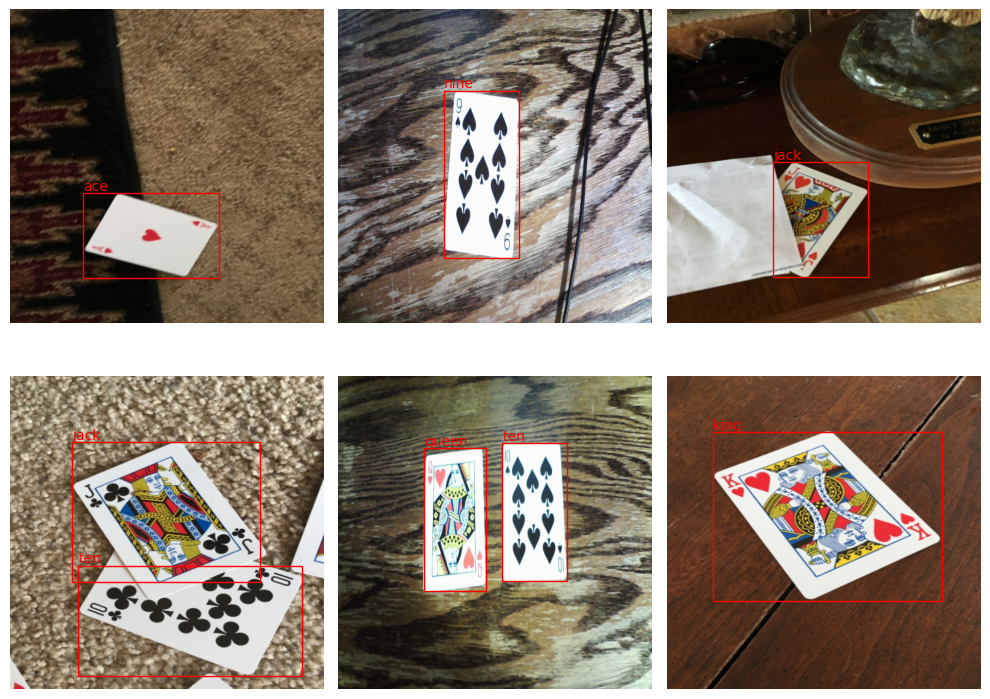

In [8]:
out = [train_ds[i] for i in range(6)]
visualize([o["image"] for o in out], [o["bboxes"] for o in out])

# Задача 3. 3 балла.
## YOLO-like детектор

Сейчас нам предстоить реализовать детектор, похожий на YOLO. Это один из самых простых детекторов с точки зрения реализации. YOLO описан в статье: [You Only Look Once: Unified, Real-Time Object Detection](https://arxiv.org/abs/1506.02640). Здесь мы его немного изменим и упростим. Будем использовать ResNet для извлечения признаков. На выходе мы будем получать карту признаков размера 16x16.

We convert lists of bounding boxes to the target downsampled grid. For this we

* compute centers of bounding boxes ($c_x, c_y$)
* change center coordinates (offset from the top left corner for each corresponding grid cell on a small grid)
* normalize box height and with to $[0, 1]$
* fill the target grid with values

## Задача 3.1. 1 балл.

Первым делом нам нужно реализовать collate function. Это функция позволит нам кастомизировать, как именно батч конструируется из примеров (смотрите [pytorch docs](https://pytorch.org/docs/stable/data.html#dataloader-collate-fn) для деталей).

Это функция должна принять на вход лист прямоугольников и сгенерировать тензор размера Bx16x16x6. Первая размерность - это количество примеров в батче. Далее идут две пространственные размерности, это сетка 16 на 16.

В каналах у нас будут записаны:
* Сдвиги центра bbox относительно начала клеточки (клеточка это "пиксель" на изображении 16 на 16 на выходе сети). Записаны эти сдвиги будут в клеточку, к которой относятся. 2 канала (X, Y)
* Нормализованные ширина и высота bbox. 2 канала (W, H)
* Confidence сетки. Им мы будем пользоваться, чтобы фильтровать уверенность сетки в наличии bbox в данной клетке. Таргет содержит 1 там, где bbox есть, и 0 иначе. 1 канал
* Класс детекции (тот самый int, полученный из строки с названием)

In [9]:
def collate_fn(batch, downsample=32):
    imgs, batch_boxes = map(list, (zip(*[(b["image"], b["bboxes"]) for b in batch])))

    imgs = torch.stack(imgs)
    b, _, h, w = imgs.shape

    target = imgs.new_zeros(b, 6, h // downsample, w // downsample)

    # Add sample index to targets
    for i, boxes in enumerate(batch_boxes):
        xmin, ymin, xmax, ymax, classes = map(
            torch.squeeze, torch.split(imgs.new_tensor(boxes), 1, dim=-1)
        )

        x_cell = (xmax + xmin) / 2
        y_cell = (ymax + ymin) / 2
        w_box = (xmax - xmin) / w
        h_box = (ymax - ymin) / h

        cx =  x_cell
        cy =  y_cell
        cx_idx = (x_cell / downsample).to(torch.int)
        cy_idx = (y_cell / downsample).to(torch.int)

        cx_box = x_cell - cx_idx.to(torch.float) * downsample
        cy_box = y_cell - cy_idx.to(torch.float) * downsample

        target[i, :, cy_idx, cx_idx] = torch.stack(
            [cx_box, cy_box, w_box, h_box, torch.ones_like(cx_box), classes]
        )

    return {"image": imgs, "target": target}


Ниже вы можете увидеть пример, как выглядит решетка размера 16 на 16 на исходном изображении:

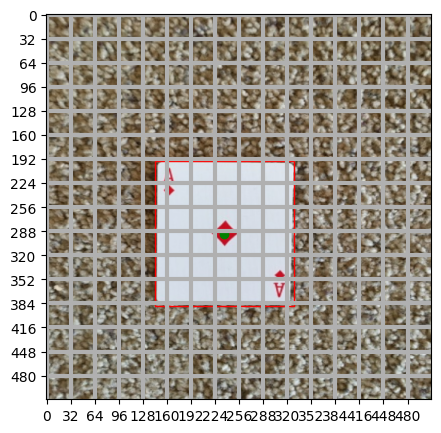

In [10]:
fig, ax = plt.subplots(figsize=(5, 5))
i = 20

img = train_ds[i]["image"].permute(1, 2, 0) * torch.tensor(std).view(
    1, 1, -1
) + torch.tensor(mean).view(1, 1, -1)
bboxes = torch.tensor(train_ds[i]["bboxes"])

ax.imshow(img)
loc = plt.matplotlib.ticker.MultipleLocator(base=32)
ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)
ax.grid(which="major", axis="both", linestyle="-", linewidth=3)

for bbox in bboxes:
    xmin, ymin, xmax, ymax = bbox[:-1]
    w = xmax - xmin
    h = ymax - ymin
    with_mask = bbox[-1]
    ax.add_patch(Rectangle((xmin, ymin), w, h, fill=False, color="red"))

cx = (bboxes[:, 0] + bboxes[:, 2]) / 2
cy = (bboxes[:, 1] + bboxes[:, 3]) / 2

ax.scatter(cx, cy, color="green", marker="o")

plt.show()

## Задача 3.2. 0.5 балла.

Выход нашей сетки будет несколько больше, чем Bx16x16x6. Почему?

Мы решаем задачу, где классов больше одного. Вспомним прошлое дз: target был одним числом, но выход сетки содержал длинный-длинный вектор, из которого мы получали вероятность принадлежности к тому или иному классу. Здесь то же самое, но как бы в двумерии: у каждой клеточки из этих 16*16 будет свой вектор длины C, который мы будем использовать для определения класса.

Реализуйте обратное относительно collate_fn преобразования, чтобы декодировать выход нейронной сети. Применив функцию decode_prediction к выходу collate function вы должны получить изначальный набор прямоугольников с корректными размерами и координатами, а также классами. Применив к выходу нейросети мы тоже должны получить набор прямоугольников и тоже с корректными классами.

То есть, нужно проделать операции из collate_fn в обратную сторону, но учесть, что у неройнки выход будет чуть длиннее, и там мы должны брать argmax для определения класса.

Hint: в target classes идут в конце. В нейронке они тоже будут в конце, но их будет больше 1. Можно проверять число каналов пришедшего объекта, если оно 6, то перед нами target и надо брать значение, которое записано в клеточке. Иначе (каналов больше 6) перед нами выход нейронки, и надо брать самый вероятный из них.

In [37]:
def decode_prediction(pred, upsample=32, threshold=0.7):
    b, c, h, w = pred.shape
    img_w, img_h = w * upsample, h * upsample
    decoded_boxes = []

    for i in range(b):
        mask = pred[i, 4] >= threshold
        cx_box, cy_box, w_box, h_box = pred[i, :4, mask]

        nonzero_indices = mask.nonzero(as_tuple=False)
        xmin = ((nonzero_indices[:, 1] + cx_box) * upsample - w_box * img_w / 2)
        ymin = ((nonzero_indices[:, 0] + cy_box) * upsample - h_box * img_h / 2)
        xmax = ((nonzero_indices[:, 1] + cx_box) * upsample + w_box * img_w / 2)
        ymax = ((nonzero_indices[:, 0] + cy_box) * upsample + h_box * img_h / 2)

        if c == 6:
            classes = pred[i, 5, mask].long()
        else:
            classes = torch.argmax(pred[i, 5:, mask], dim=0).long()

        decoded_boxes.append(list(zip(xmin.tolist(), ymin.tolist(), xmax.tolist(), ymax.tolist(), classes.tolist())))

    return decoded_boxes


## Задача 3.3. 1 балл.
Реализуйте модель. Первым делом примените первые 4 блока (до layer4 включительно) ResNet50. Далее добавьте несколько блоков (Conv2D, BatchNorm2D, ReLU). Постепенно уменьшайте количество каналов до 5+C, а размер изображения до 16 на 16. Например, 2048 -> 512 -> 128 -> 32 -> 5+C, где С - количество классов в вашем датасете. Размер ядра при этом 3, паддинг 1. Но вариантов много, попробуйте разные! **Последним слоем обязательно должна быть свертка.** Так как все значения, которые мы предсказываем, находятся в отрезке от 0 до 1 (благодаря нормировке с клеточками), мы после финальной свертки еще применим сигмоиду. Для классов в такой постановке это не навредит.

Если будете фантазировать, то для получения правильного размера изображения после сети не стесняйтесь применять слои с фильтрами больше 3.

In [12]:
C = len(train_ds.class_dict)

import torch.nn.functional as F

class Detector(nn.Module):
    def __init__(self, num_classes):
        super(Detector, self).__init__()
        model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)

        self.resnet_blocks = nn.Sequential(
            model.conv1, model.bn1, model.relu, model.maxpool,
            model.layer1, model.layer2, model.layer3, model.layer4
        )

        self.detect_blocks = nn.Sequential(
            nn.Conv2d(2048, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 5 + num_classes, kernel_size=3, padding=1),
        )

    def forward(self, img):
        x = self.resnet_blocks(img)
        x = self.detect_blocks(x)
        x = F.sigmoid(x)
        return x


## Задача 3.4. 0.5 балла.

Реализуйте функцию потерь.

Для этого:
* Сделайте маску, которая будет говорить о положении детектируемых объектов. Её нужно использовать с помощью masked_select (см. доки PyTorch)
* Лосс похож на оригинальный для Yolo V1 и состоит из 4 частей (reduction='sum' для всех)
    - localization loss - Мы берем MSE по координатам бокса там, где есть детектируемый объект
    - box_loss - MSE от корней ширины и высоты bbox там, где есть детектируемый объект
    - classification_loss - Если детектируемый объект есть, то его кросс-энтропия по его классу
    - confidence_loss - Бинарная кросс-энтропия факта наличия объекта ДЛЯ ВСЕХ пикселей. Делается отдельно для детектируемых объектов (вес 1) и для недетектируемых (вес 0.1 например, поскольку их гораздо больше, но можно экспериментировать)


* Ниже есть assert. Если вы экспериментируете с лоссом, он не будет проходить, не обращайте на него внимание. Если будете делать описанное выше, то учтите reduction. Бинарная кросс-энтропия вызывается через BCELoss. Параметр C используется для задачи числа классов. assert написан для 3 классов, в задаче с картами их 6. Подумайте как зависит индексация от параметра C и используйте его.

In [13]:
import torch.nn as nn

def special_loss(pred, target, check=False, C=None):
    mask_obj = target[:, 4, :, :] == 1

    mse_loss = nn.MSELoss(reduction='sum')
    bce_loss = nn.BCELoss(reduction='sum')

    localization_loss = mse_loss(torch.masked_select(pred[:, :2, :, :], mask_obj.unsqueeze(1).expand_as(pred[:, :2, :, :])).view(-1),
                                 torch.masked_select(target[:, :2, :, :], mask_obj.unsqueeze(1).expand_as(pred[:, :2, :, :])).view(-1))

    box_loss = mse_loss(torch.masked_select(pred[:, 2:4, :, :], mask_obj.unsqueeze(1).expand_as(pred[:, 2:4, :, :])).view(-1),
                        torch.masked_select(target[:, 2:4, :, :], mask_obj.unsqueeze(1).expand_as(pred[:, 2:4, :, :])).view(-1))

    сlassification_loss = F.cross_entropy(pred[:, 5:, :, :].permute(0, 2, 3, 1)[mask_obj],
                                       target[:, 5, :, :][mask_obj].long(), reduction='sum')



    confidence_loss = bce_loss(torch.masked_select(pred[:, 4, :, :], mask_obj), torch.masked_select(target[:, 4, :, :], mask_obj))
    confidence_loss_neg = bce_loss(torch.masked_select(pred[:, 4, :, :], ~mask_obj), torch.masked_select(target[:, 4, :, :], ~mask_obj)) / 10

    print(localization_loss, box_loss, сlassification_loss, confidence_loss + confidence_loss_neg)

    if not check:
        return localization_loss + box_loss + сlassification_loss + confidence_loss + confidence_loss_neg
    else:
        return localization_loss, box_loss, сlassification_loss, confidence_loss + confidence_loss_neg


In [14]:
# localization box classification confidence - возвращаются в таком порядке, можно сравнить
special_loss(torch.zeros((10, 8, 16, 16)), torch.ones((10, 8, 16, 16)), check=True, C=3)


assert special_loss(torch.zeros((10, 8, 16, 16)), torch.ones((10, 8, 16, 16)), check=True, C=3) == (torch.tensor(5120.), torch.tensor(5120.), torch.tensor(2812.4465), torch.tensor(256000.))


tensor(5120.) tensor(5120.) tensor(2812.4465) tensor(256000.)
tensor(5120.) tensor(5120.) tensor(2812.4465) tensor(256000.)


# Задача 4. 2 балла.

Обучите вашу модель (написав цикл обучения), и покажите что она работает (скорее всего, объекты найдутся на 1-2 картинках).

In [15]:
loader = torch.utils.data.DataLoader(train_ds, 10, collate_fn=collate_fn)

In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.autograd.set_detect_anomaly(True)
torch.cuda.manual_seed(21)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(21)
EPOCHS = 15
model = Detector(len(train_ds.class_dict)).to(device)
opt = torch.optim.AdamW(model.parameters(), lr=1e-3)

for e in tqdm(range(EPOCHS)):
    pbar = tqdm(loader, leave=False)
    epoch_losses = []
    for batch in pbar:
        ### YOUR CODE HERE ###
        img = batch["image"].to(device)
        target = batch["target"].to(device)
        opt.zero_grad()
        pred = model(img)
        loss = special_loss(pred, target)
        loss.backward()
        opt.step()
        epoch_losses.append(loss.item())

    print(f"Epoch {e} done; Train loss {np.mean(epoch_losses):.3f};")

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 112MB/s]


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(12271.2471, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7708, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(30.1665, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(180.7013, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10705.0889, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(29.5259, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(169.4598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8636.3271, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(31.2823, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(159.2040, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13107.1855, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3877, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(36.3128, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(150.1699, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9905.9834, device='cud

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11712.5879, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.6998, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(30.6433, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(32.1337, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10496.3203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.4376, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(31.6674, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(27.6984, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.9463, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.5054, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(29.9350, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(30.0107, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13067.6523, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.3893, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(38.2242, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(26.8581, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9862.9531, device='cuda:0'

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.5518, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.4885, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(27.4212, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(11.1226, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.8223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.4598, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(26.8604, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(10.2132, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.4102, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.5108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(26.5109, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(9.5276, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.7539, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.3741, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(33.6383, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(10.7419, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.8262, device='cuda:0',

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.4746, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.2740, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(24.7179, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(5.8910, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.7734, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.3617, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(24.5301, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(4.8687, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.4014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.3887, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(24.4485, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(4.8833, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.6855, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.3528, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(31.3125, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(6.0234, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.7754, device='cuda:0', gr

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.5098, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.2955, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(24.2744, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(5.3238, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.7881, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.2938, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(24.3446, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(4.0442, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.4443, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1946, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(24.8774, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(8.7980, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.5986, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.2186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(30.9282, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(5.6019, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.7617, device='cuda:0', gr

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.4707, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.4572, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(23.1027, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(5.6487, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.7402, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.2916, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(24.1775, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(4.4564, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.3428, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.2088, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(22.9127, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(3.3319, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.8320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.3000, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(29.0858, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(6.0889, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.6934, device='cuda:0', gr

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.4531, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.2845, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(22.5792, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(5.6033, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.7578, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.3489, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(23.4519, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(7.3353, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.3232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.2849, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(22.5189, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(2.9827, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.5107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1611, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(28.8913, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(3.5747, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.6670, device='cuda:0', gr

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.4404, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1778, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(22.3824, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.4687, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.7285, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.2393, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(22.7439, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.3207, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.3457, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1422, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(22.3294, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.8373, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.5186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1603, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(28.1808, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.2620, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.6719, device='cuda:0', gr

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.4287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1734, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(22.1470, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.1664, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.7227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1734, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(22.4877, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.4465, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.3154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1323, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(22.1258, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.7051, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.4844, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(28.1687, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.0134, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.6572, device='cuda:0', gr

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.4258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1538, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.7700, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.9461, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.7188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1715, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(22.4451, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.6025, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.3096, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1445, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.8122, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.7587, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.4980, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0989, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(27.4265, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.8047, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.6582, device='cuda:0', gr

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.4180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1505, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.2691, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.5769, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.7080, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0937, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(22.2187, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.6291, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.2979, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1390, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.3428, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.5451, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.4697, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0669, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(27.0782, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.7487, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.6514, device='cuda:0', gr

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.4307, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0949, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.4201, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.6303, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.7188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0666, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.6914, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.2027, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.3174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.9434, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.1175, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.4893, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0740, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(26.8411, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.5596, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.6533, device='cuda:0', gr

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.4277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0686, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.4484, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.7816, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.7070, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0989, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.7056, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.6421, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.2969, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(22.2494, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.4354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.4629, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0847, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(26.9026, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.4435, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.6484, device='cuda:0', gr

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.4658, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1608, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.5826, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.8479, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.7051, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0835, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.8659, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.4318, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.3418, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.2502, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.4109, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.4824, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(26.5286, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(1.2810, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.6504, device='cuda:0', gr

  0%|          | 0/33 [00:00<?, ?it/s]

tensor(11711.4199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1541, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(20.8987, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.4283, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10495.7061, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.3467, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.3548, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8587.2988, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.1502, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(21.1051, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.3698, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13066.4668, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0778, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(25.7977, device='cuda:0', grad_fn=<NllLossBackward0>) tensor(0.3949, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9861.6543, device='cuda:0', gr

Запустим обученный детектор на тестовых изображениях:

In [20]:
test_loader = torch.utils.data.DataLoader(test_ds, 6, collate_fn=collate_fn)
i = iter(test_loader)
batch = next(i)


In [38]:
# Нужно сделать предсказание и переложить результат на cpu переписать

model.eval()
prediction = [
    {
        'image': batch['image'].cpu(),
        'bboxes': decode_prediction(model(batch['image'].to(device)).detach().cpu(), threshold=0.1)
    }
    for batch in test_loader
]

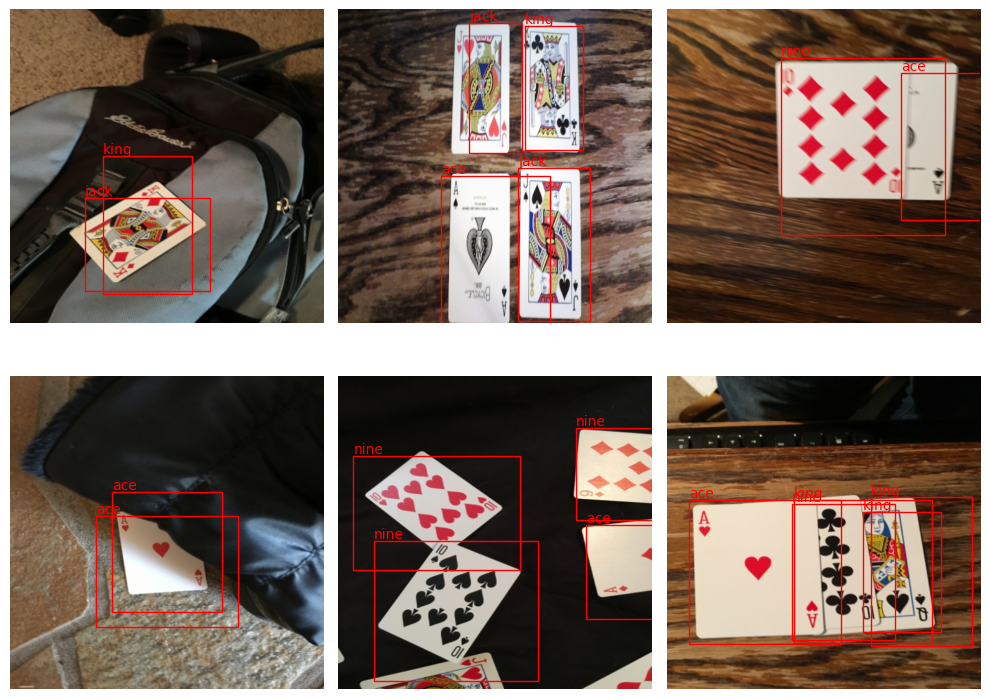

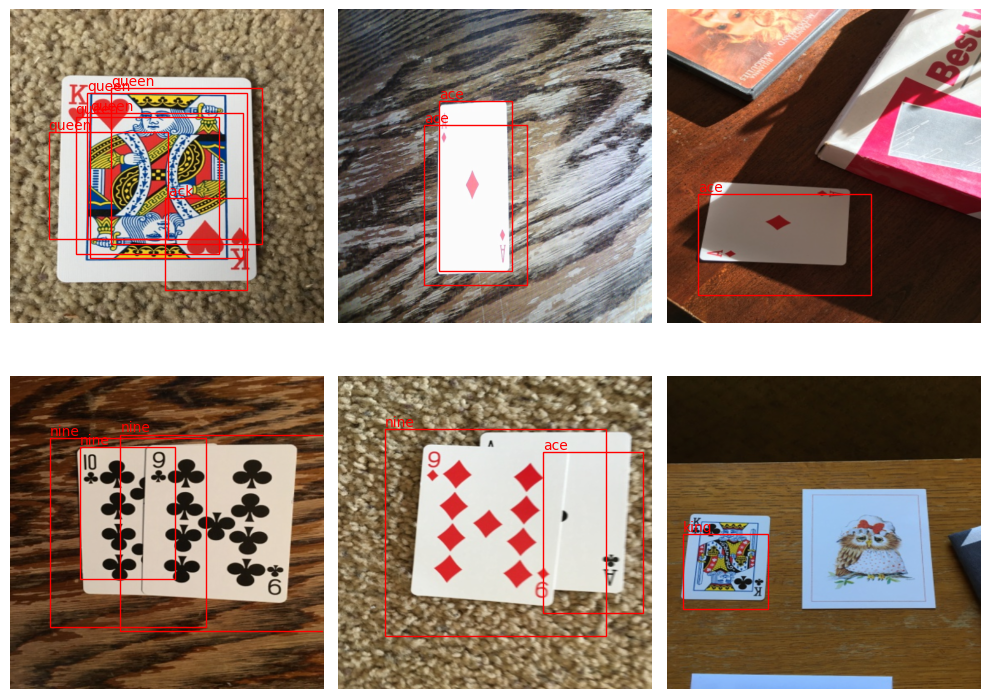

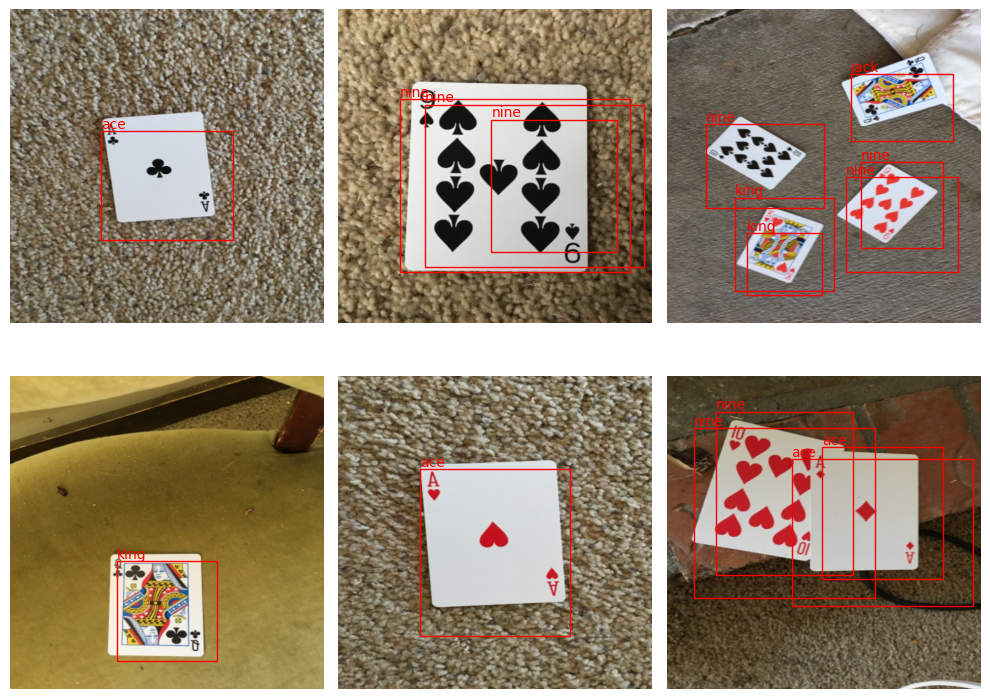

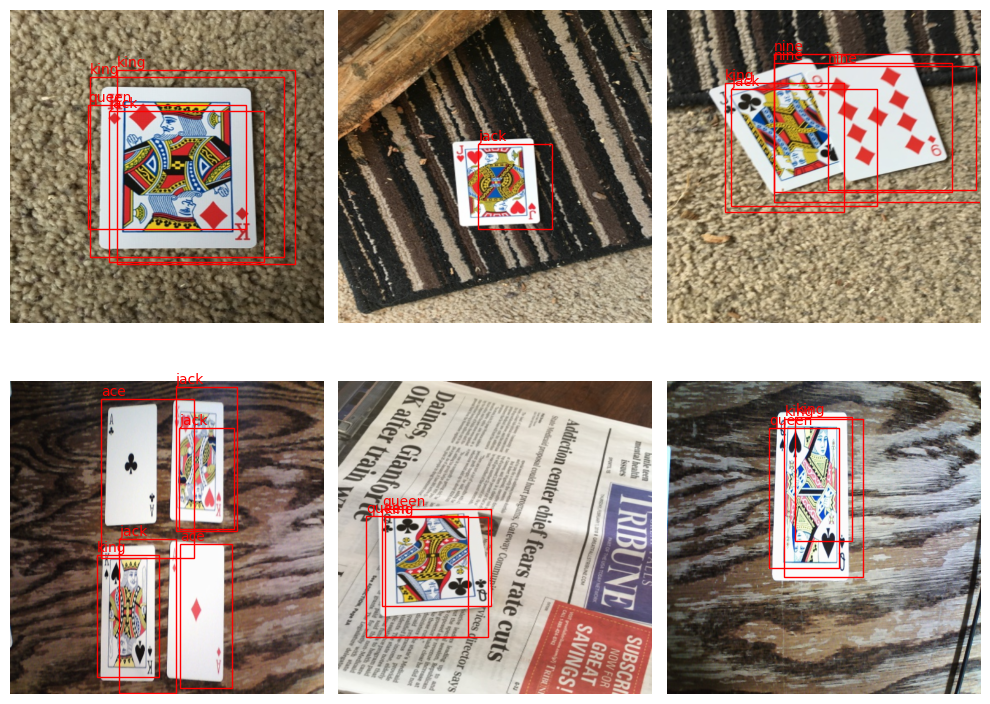

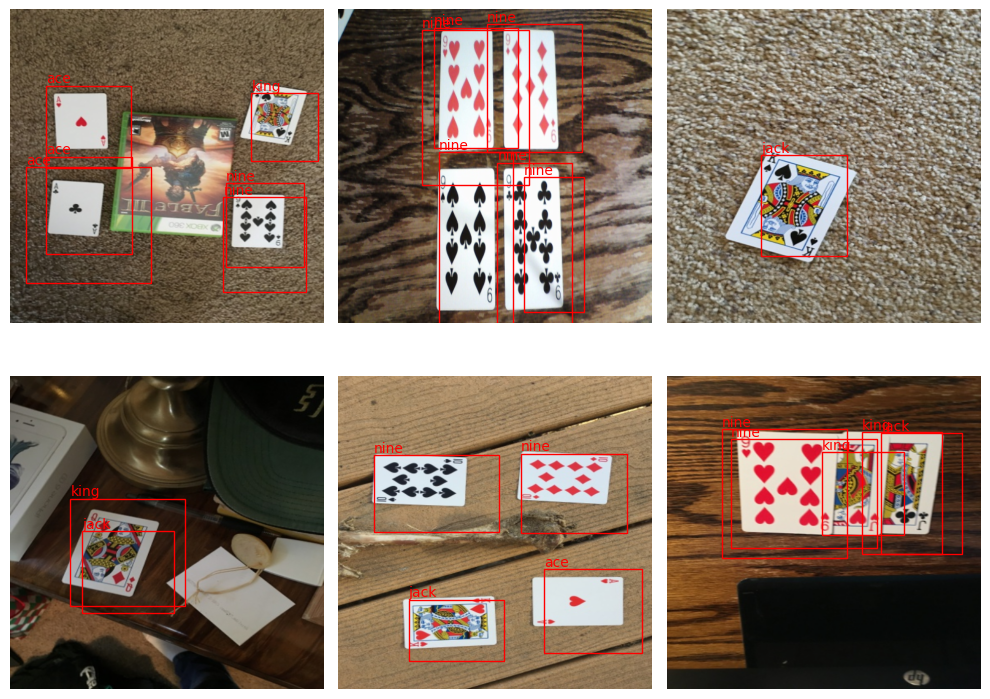

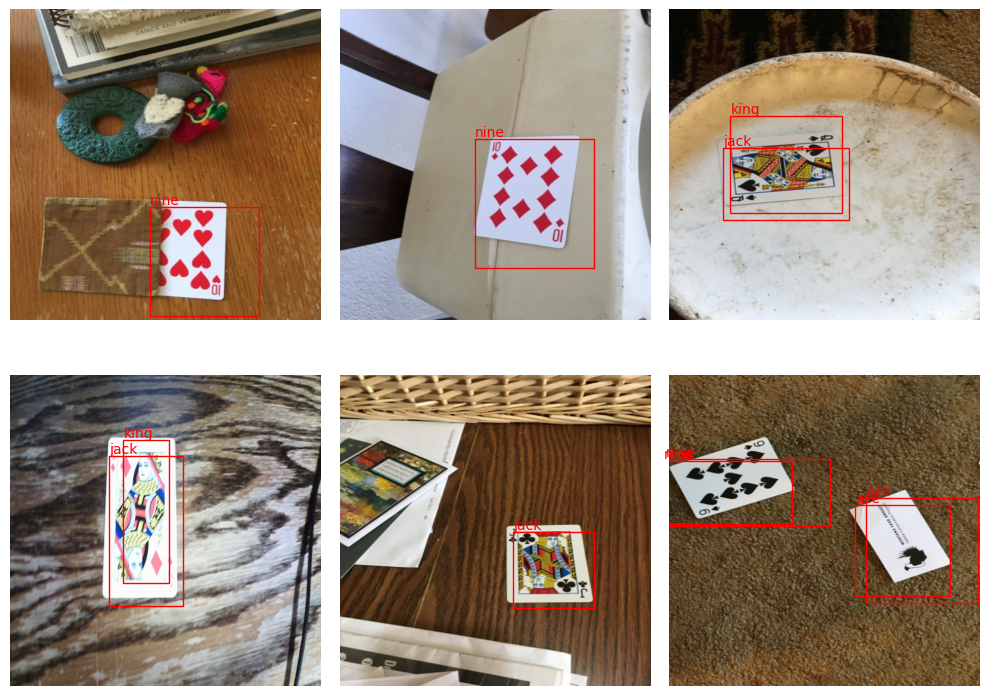

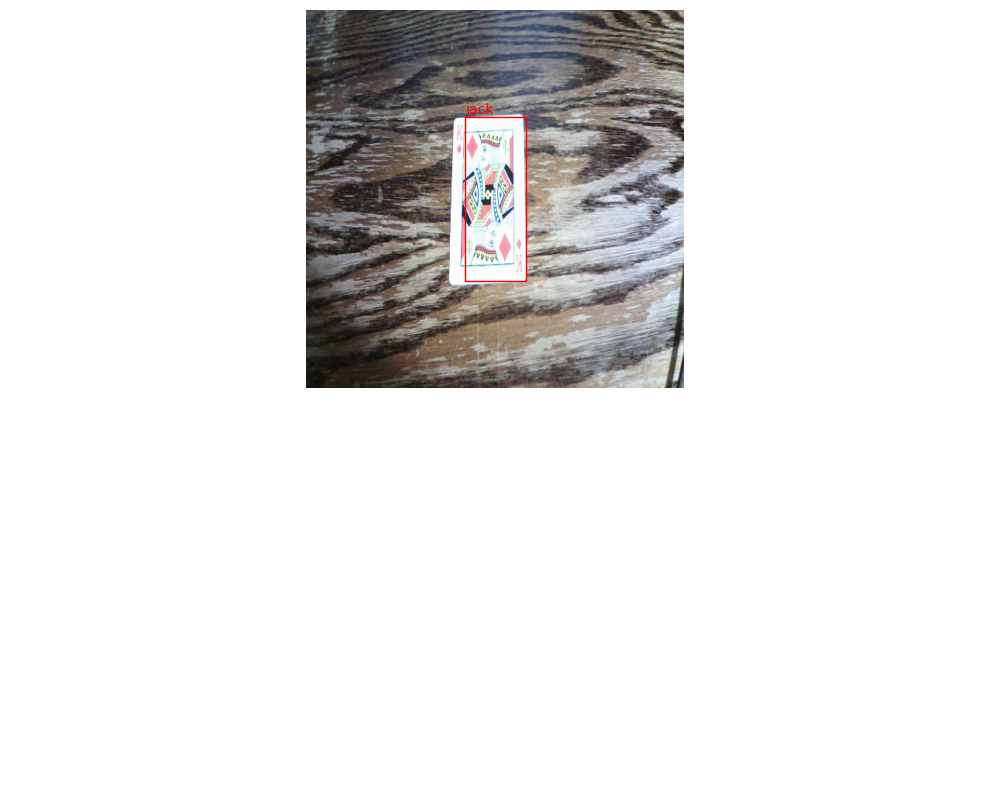

In [41]:
# Сделайте визуализацию. Поиграйтесь с threshold, скорее всего нужно понизить до ~0.1

_ = [visualize(batch['image'], batch['bboxes']) for batch in prediction]




Результат сильно так себе, да? Есть множество вариантов улучшений, самый простой из которых это приделать к выходу [NMS](https://paperswithcode.com/method/non-maximum-suppression#:~:text=Non%20Maximum%20Suppression%20is%20a,below%20a%20given%20probability%20bound.). Если хочется, можно почитать про YOLO v1 [тут](https://arxiv.org/abs/1506.02640).

# Задача 5. 3.5 балла.

Займёмся более простыми вещами. Возьмем готовую архитектуру, обучим её на наших данных и посмотрим.

Для этого будем использовать YOLO v8 от ultralytics.

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.1/660.1 kB 6.3 MB/s eta 0:00:00


## Задача 5.1. 1.5 балла.

Чтобы дальше модель обучалась одной строкой, данные нужно переложить в правильный формат. Да-да, классика перекладывания JSON. Как правильно паковать можно посмотреть [тут](https://roboflow.com/formats/yolov8-pytorch-txt).

Если коротко:
* Есть .yaml, где живут пути к папкам с картинками, количество классов и их названия
* Есть папочки train valid (их поможем вам собрать), в них две подпапки:
    - Первая images, в ней лежат картинки
    - Вторая labels, в ней лежат файлы с названиями как у картинок, но вместо расширения картинок нужен .txt, внутри формат как описан на Roboflow


In [ ]:
# Делаем папочки
!rm -rf train
!rm -rf valid
!mkdir -p train/images train/labels valid/images valid/labels

Реализуйте функцию, которая принимает аннотации в изначальном формате, а возвращает их в нужном для YOLO v8. Это должен быть массив готовых строк, которые можно сразу забрасывать в файлик, добавив \n.

In [ ]:
def annotation2txt(bboxes, w_im, h_im):
    ### YOUR CODE HERE ###
    txt_annotations = []

    for bbox in bboxes:
        xmin, ymin, xmax, ymax, class_idx  = bbox

        cx = (xmin + xmax) / (2.0 * w_im)
        cy = (ymin + ymax) / (2.0 * h_im)
        w = (xmax - xmin) / w_im
        h = (ymax - ymin) / h_im

        txt_annotations.append(f"{class_idx} {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}")

    return txt_annotations




In [ ]:
# Копируем картиночки по папочкам и создаем txt файлики

for i in range(len(train_ds)):
    result = train_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0], "./train/images/" + result[0].split("/")[-1],
    )

    h_im, w_im, ch = np.array(Image.open(result[0])).shape
    with open(
        "./train/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

for i in range(len(test_ds)):
    result = test_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0], "./valid/images/" + result[0].split("/")[-1],
    )

    with open(
        "./valid/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

In [ ]:
# Собираем YAML

dataset = PascalDataset(root="./data/", transform=train_transform, train=True)

# Получаем количество классов и их имена
nc = len(dataset.class_dict)
names = list(dataset.class_dict.keys())

# Записываем информацию в файл data.yaml
with open("data.yaml", "w") as f:
    f.write(f"train: ../train/images\nval: ../valid/images\n\nnc: {nc}\nnames: {names}")

## Задание 5.2. 1.5 балла.

Обучите модель YOLO v8 самого маленького размера. Библиотека максимально friendly, от вас требуется написать две строчки. Модель нужно взять необученную!

Подсказка: подумайте зачем вам data.yaml и что такое yolov8n.yaml (не стесняйтесь гуглить)

In [ ]:
import ultralytics
from ultralytics import YOLO
model = ultralytics.YOLO("yolov8n.yaml")
model.train(data="data.yaml")


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

100%|██████████| 755k/755k [00:00<00:00, 25.4MB/s]


Overriding model.yaml nc=80 with nc=6

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 90.3MB/s]


AMP: checks passed ✅


train: Scanning /content/train/labels... 326 images, 0 backgrounds, 0 corrupt: 100%|██████████| 326/326 [00:00<00:00, 2001.58it/s]

train: New cache created: /content/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/valid/labels... 37 images, 0 backgrounds, 7 corrupt: 100%|██████████| 37/37 [00:00<00:00, 1269.30it/s]

val: WARNING ⚠️ /content/valid/images/cam_image12.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.2196]
val: WARNING ⚠️ /content/valid/images/cam_image16.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0952]
val: WARNING ⚠️ /content/valid/images/cam_image21.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1574]
val: WARNING ⚠️ /content/valid/images/cam_image23.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0622]
val: WARNING ⚠️ /content/valid/images/cam_image37.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.5013      1.5093]
val: WARNING ⚠️ /content/valid/images/cam_image38.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.7209      1.1534       1.713      1.1389]
val: WARNING ⚠️ /content/valid/images/cam_image6.jpg: ignoring corrupt image/label: non-normal

Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.54G      3.029      4.677      4.412         21        640: 100%|██████████| 21/21 [00:08<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]

                   all         30         52   0.000745      0.105    0.00061   9.65e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.43G      2.947      4.339       4.09         18        640: 100%|██████████| 21/21 [00:06<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

                   all         30         52   0.000899      0.121   0.000649    0.00013



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.43G       2.88      3.926      3.833         31        640: 100%|██████████| 21/21 [00:07<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

                   all         30         52   0.000925      0.121    0.00062   0.000121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.43G      2.851       3.69        3.6         27        640: 100%|██████████| 21/21 [00:05<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

                   all         30         52   0.000677      0.105   0.000697   0.000127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.43G      2.763      3.557      3.401         28        640: 100%|██████████| 21/21 [00:07<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

                   all         30         52    0.00168      0.249     0.0139    0.00342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.43G      2.714      3.472      3.272         17        640: 100%|██████████| 21/21 [00:05<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

                   all         30         52     0.0032       0.49     0.0783     0.0391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.43G      2.598      3.194      3.112         24        640: 100%|██████████| 21/21 [00:07<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

                   all         30         52      0.379      0.141      0.124     0.0459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.43G      2.376        3.1      3.037         24        640: 100%|██████████| 21/21 [00:05<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         30         52      0.104      0.272       0.16     0.0686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.43G      2.263      2.954      2.904         29        640: 100%|██████████| 21/21 [00:09<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         30         52      0.136      0.294      0.155     0.0675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.43G      2.139      2.866      2.788         24        640: 100%|██████████| 21/21 [00:05<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

                   all         30         52      0.212      0.396      0.279      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.41G      1.977      2.705      2.651         20        640: 100%|██████████| 21/21 [00:06<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all         30         52      0.184      0.354      0.153     0.0842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.43G      1.926      2.689      2.575         18        640: 100%|██████████| 21/21 [00:06<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

                   all         30         52      0.236       0.42      0.305      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.43G      1.803      2.529      2.414         22        640: 100%|██████████| 21/21 [00:06<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         30         52      0.343      0.596      0.385      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.46G       1.81      2.472       2.39         15        640: 100%|██████████| 21/21 [00:06<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

                   all         30         52      0.303      0.716      0.432      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.44G      1.677      2.352      2.296         23        640: 100%|██████████| 21/21 [00:05<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

                   all         30         52      0.432        0.5      0.431       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.44G      1.606      2.346      2.196         20        640: 100%|██████████| 21/21 [00:07<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

                   all         30         52      0.445      0.631      0.497      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.43G      1.551      2.231      2.166         15        640: 100%|██████████| 21/21 [00:06<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all         30         52      0.445      0.589      0.548      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.43G      1.489       2.15      2.074         21        640: 100%|██████████| 21/21 [00:07<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

                   all         30         52      0.422      0.405      0.523      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.44G      1.449      2.144      2.044         15        640: 100%|██████████| 21/21 [00:06<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

                   all         30         52      0.419      0.618      0.553      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.44G      1.385      2.012      1.962         17        640: 100%|██████████| 21/21 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all         30         52      0.476      0.701      0.544      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.42G      1.325      1.979      1.934         22        640: 100%|██████████| 21/21 [00:07<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         30         52      0.368      0.616      0.464      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.44G      1.294      1.954      1.877         32        640: 100%|██████████| 21/21 [00:05<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         30         52      0.363      0.733      0.547      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.43G      1.317      1.956      1.873         29        640: 100%|██████████| 21/21 [00:07<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         30         52      0.425      0.739      0.535      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.43G      1.266      1.951      1.863         20        640: 100%|██████████| 21/21 [00:05<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         30         52      0.414      0.842      0.576      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.42G      1.236      1.872      1.809         23        640: 100%|██████████| 21/21 [00:07<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

                   all         30         52       0.55      0.622      0.582      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.43G      1.209      1.804      1.783         22        640: 100%|██████████| 21/21 [00:05<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

                   all         30         52      0.536      0.654      0.572      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.43G      1.205      1.829      1.783         23        640: 100%|██████████| 21/21 [00:10<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

                   all         30         52      0.531      0.657       0.66      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.41G      1.208      1.802      1.764         19        640: 100%|██████████| 21/21 [00:09<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

                   all         30         52      0.439      0.738       0.57      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.43G      1.197      1.779      1.758         14        640: 100%|██████████| 21/21 [00:07<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

                   all         30         52       0.45      0.756      0.602      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.43G      1.149      1.717      1.699         25        640: 100%|██████████| 21/21 [00:12<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

                   all         30         52      0.603      0.643      0.701      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.43G      1.123      1.675      1.676         26        640: 100%|██████████| 21/21 [00:05<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

                   all         30         52      0.522      0.704      0.714      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.43G      1.136      1.703      1.673         20        640: 100%|██████████| 21/21 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all         30         52      0.555      0.834      0.667      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100       2.4G      1.107      1.654      1.648         28        640: 100%|██████████| 21/21 [00:05<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

                   all         30         52      0.605      0.792      0.719      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.43G      1.077      1.632      1.625         28        640: 100%|██████████| 21/21 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all         30         52      0.608      0.627      0.647      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.44G      1.078      1.627      1.612         21        640: 100%|██████████| 21/21 [00:06<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

                   all         30         52      0.448      0.717      0.563      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.43G      1.038      1.614       1.58         20        640: 100%|██████████| 21/21 [00:07<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         30         52       0.48      0.707      0.729      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.41G      1.013      1.586      1.565         16        640: 100%|██████████| 21/21 [00:06<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

                   all         30         52       0.76      0.563      0.713      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.43G     0.9886      1.508       1.53         15        640: 100%|██████████| 21/21 [00:07<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

                   all         30         52      0.527      0.904      0.667      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.43G     0.9984      1.529      1.552         33        640: 100%|██████████| 21/21 [00:06<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

                   all         30         52      0.573      0.897      0.729      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.43G      1.005       1.53      1.539         39        640: 100%|██████████| 21/21 [00:06<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

                   all         30         52      0.516      0.876      0.721      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.42G     0.9826      1.491      1.532         22        640: 100%|██████████| 21/21 [00:07<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

                   all         30         52      0.583      0.754      0.744      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.43G     0.9719      1.467      1.522         38        640: 100%|██████████| 21/21 [00:05<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all         30         52      0.538      0.737      0.629      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.43G     0.9436      1.433        1.5         16        640: 100%|██████████| 21/21 [00:07<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         30         52      0.551      0.819      0.708      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.43G     0.9275      1.404      1.459         29        640: 100%|██████████| 21/21 [00:05<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all         30         52      0.655      0.696      0.712      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.42G     0.9279      1.387      1.476         27        640: 100%|██████████| 21/21 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         30         52      0.661      0.738      0.772      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.43G     0.9182      1.437      1.476         27        640: 100%|██████████| 21/21 [00:05<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all         30         52      0.574      0.823      0.721      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.43G     0.9346      1.421      1.478         23        640: 100%|██████████| 21/21 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         30         52       0.72      0.734      0.801       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.43G     0.8986      1.364      1.445         34        640: 100%|██████████| 21/21 [00:05<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         30         52      0.634      0.882      0.801      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.41G     0.8653      1.328      1.417         27        640: 100%|██████████| 21/21 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         30         52       0.58      0.894      0.807      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.43G     0.8861      1.344      1.434         21        640: 100%|██████████| 21/21 [00:06<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

                   all         30         52      0.581       0.92      0.749       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.43G     0.9025      1.355      1.446         28        640: 100%|██████████| 21/21 [00:06<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

                   all         30         52      0.768      0.858      0.857      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.43G     0.9007      1.307      1.441         26        640: 100%|██████████| 21/21 [00:06<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

                   all         30         52      0.691      0.786      0.804      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.43G     0.8673      1.309      1.403         15        640: 100%|██████████| 21/21 [00:06<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         30         52      0.731      0.753      0.807      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.44G     0.8915      1.312      1.441         28        640: 100%|██████████| 21/21 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

                   all         30         52      0.882      0.787      0.871      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.43G     0.8306      1.251      1.396         22        640: 100%|██████████| 21/21 [00:05<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

                   all         30         52      0.673      0.757      0.835      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.43G     0.8577      1.312      1.409         27        640: 100%|██████████| 21/21 [00:07<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all         30         52       0.64      0.856      0.875      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.42G     0.8168       1.24      1.376         22        640: 100%|██████████| 21/21 [00:05<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         30         52      0.686      0.889      0.861      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.43G     0.8441      1.228      1.388         34        640: 100%|██████████| 21/21 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         30         52      0.699      0.928      0.881      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.43G     0.8368      1.238      1.376         28        640: 100%|██████████| 21/21 [00:05<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all         30         52      0.779      0.833      0.921      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.41G     0.7912      1.208      1.331         17        640: 100%|██████████| 21/21 [00:07<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all         30         52      0.705      0.865      0.875      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.41G     0.8124      1.222      1.372         32        640: 100%|██████████| 21/21 [00:06<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

                   all         30         52      0.734      0.894      0.919      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.44G     0.7974      1.155      1.354         24        640: 100%|██████████| 21/21 [00:07<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all         30         52       0.63      0.843      0.807      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.43G     0.8144      1.222      1.382         25        640: 100%|██████████| 21/21 [00:06<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

                   all         30         52      0.766      0.868      0.905       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.44G     0.7933      1.179      1.339         18        640: 100%|██████████| 21/21 [00:06<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         30         52      0.612      0.759      0.759       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.43G     0.7956      1.191      1.363         20        640: 100%|██████████| 21/21 [00:07<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         30         52      0.888      0.741      0.888      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.43G     0.8019      1.135      1.345         38        640: 100%|██████████| 21/21 [00:05<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all         30         52      0.785      0.896      0.907       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.43G     0.8051      1.183      1.359         12        640: 100%|██████████| 21/21 [00:08<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         30         52      0.688      0.895      0.876      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.43G     0.7786      1.113      1.324         24        640: 100%|██████████| 21/21 [00:05<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         30         52      0.762       0.82      0.902      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.43G      0.761      1.112      1.306         19        640: 100%|██████████| 21/21 [00:07<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all         30         52      0.774      0.899       0.88      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.43G      0.769      1.127      1.324         21        640: 100%|██████████| 21/21 [00:06<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all         30         52      0.916      0.849       0.96      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.43G     0.7731       1.15      1.314         21        640: 100%|██████████| 21/21 [00:07<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

                   all         30         52      0.859      0.733      0.876      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.43G     0.7831      1.101      1.326         15        640: 100%|██████████| 21/21 [00:05<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

                   all         30         52      0.758       0.89      0.919      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.43G     0.7691      1.131      1.332         16        640: 100%|██████████| 21/21 [00:07<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all         30         52      0.825      0.938      0.966      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.43G     0.7695       1.08       1.32         16        640: 100%|██████████| 21/21 [00:05<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

                   all         30         52      0.866      0.877      0.967      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.44G     0.7412      1.076      1.291         16        640: 100%|██████████| 21/21 [00:06<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         30         52      0.934      0.924      0.974      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.44G     0.7482      1.032      1.297         25        640: 100%|██████████| 21/21 [00:07<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

                   all         30         52      0.958      0.697      0.908       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.43G     0.7251      1.036      1.287         21        640: 100%|██████████| 21/21 [00:06<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

                   all         30         52      0.928      0.856      0.948      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.43G     0.7199      1.021      1.277         21        640: 100%|██████████| 21/21 [00:07<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

                   all         30         52      0.894      0.821      0.942      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.43G     0.7129      1.043      1.288         22        640: 100%|██████████| 21/21 [00:05<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

                   all         30         52      0.665      0.743      0.784        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.43G     0.7186      1.055      1.276         32        640: 100%|██████████| 21/21 [00:07<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all         30         52      0.732      0.883      0.922      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.43G     0.7227      1.051      1.287         19        640: 100%|██████████| 21/21 [00:05<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all         30         52      0.904      0.802      0.909      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.43G     0.7182       1.02      1.268         19        640: 100%|██████████| 21/21 [00:07<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all         30         52      0.864      0.911       0.98      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.43G     0.7019      1.024       1.25         16        640: 100%|██████████| 21/21 [00:05<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all         30         52      0.834      0.914      0.959      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.43G     0.7058      1.036      1.267         20        640: 100%|██████████| 21/21 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

                   all         30         52      0.834      0.874      0.923       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.43G     0.7169      1.026       1.28         28        640: 100%|██████████| 21/21 [00:05<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all         30         52      0.782      0.904      0.926      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.43G     0.6955     0.9772      1.252         24        640: 100%|██████████| 21/21 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         30         52      0.919      0.843      0.957      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.43G     0.6878     0.9739      1.239         22        640: 100%|██████████| 21/21 [00:05<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

                   all         30         52      0.964      0.777      0.939       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.44G     0.6869     0.9498      1.242         13        640: 100%|██████████| 21/21 [00:07<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all         30         52      0.944      0.793      0.936      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.43G     0.6821     0.9278      1.241         19        640: 100%|██████████| 21/21 [00:06<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

                   all         30         52      0.883       0.91      0.952      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.43G     0.7143     0.9822      1.277         28        640: 100%|██████████| 21/21 [00:07<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all         30         52      0.845      0.922      0.955      0.846


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.55G     0.5547     0.8491      1.109         15        640: 100%|██████████| 21/21 [00:09<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

                   all         30         52      0.893      0.895      0.953      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.41G     0.5267     0.8107      1.101         11        640: 100%|██████████| 21/21 [00:05<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all         30         52      0.839      0.924      0.944       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.41G     0.5178      0.744      1.092         12        640: 100%|██████████| 21/21 [00:07<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

                   all         30         52      0.931      0.807      0.931      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.41G     0.5159     0.7766      1.075         11        640: 100%|██████████| 21/21 [00:05<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         30         52      0.917      0.873      0.958      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.41G     0.5038     0.7508      1.062         10        640: 100%|██████████| 21/21 [00:06<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

                   all         30         52      0.927       0.89      0.958      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.42G     0.5051     0.7554      1.083         14        640: 100%|██████████| 21/21 [00:05<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

                   all         30         52      0.908       0.88      0.943      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100       2.4G     0.5018     0.7148      1.069         14        640: 100%|██████████| 21/21 [00:06<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

                   all         30         52      0.879       0.92       0.96      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.41G     0.4923     0.7011       1.06         10        640: 100%|██████████| 21/21 [00:05<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         30         52      0.944      0.838      0.946      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.41G     0.5016     0.7255      1.073          8        640: 100%|██████████| 21/21 [00:06<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

                   all         30         52      0.928      0.864      0.951      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.41G     0.5104     0.7053      1.073          8        640: 100%|██████████| 21/21 [00:05<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

                   all         30         52      0.891      0.931      0.965      0.849



100 epochs completed in 0.238 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.225 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3006818 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


                   all         30         52      0.935      0.924      0.974      0.867
                  king         30          8      0.917          1      0.995      0.976
                  jack         30          6        0.9      0.833      0.891      0.749
                   ace         30         12          1      0.863      0.995      0.906
                   ten         30         11       0.98          1      0.995      0.842
                  nine         30          9      0.812      0.889      0.975      0.868
                 queen         30          6          1      0.957      0.995       0.86
Speed: 0.2ms preprocess, 1.8ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d9ba0ba6020>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

## Задание 5.3. 0.5 балла.

Как-нибудь отрисуйте предсказания на валидационной выборке (хотя бы части из 5-10 картинок).

Здесь можно использовать костыли с параметром save=True у predict, потом прочитать их чем-нибудь, отрисовать матплотлибом. Есть варианты и получше. Дефолтный show будет пытаться показывать через opencv imshow, он в коллабе работать не будет.

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import torch

res = model.predict("./valid/images")

def visualize(images, bboxes):
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    fig, axes = plt.subplots(
        2, len(images) // 2 + len(images) % 2, figsize=(10, 8), dpi=100
    )

    for i, ax in enumerate(axes.reshape(-1)):

        ax.axis(False)

        if i >= len(images):
            break

        image = images[i].permute(1, 2, 0).numpy()
        image = (image * std) + mean
        image = np.clip(image, 0, 1)

        ax.imshow(image)

        for y in range(len(res[i].boxes.cls)):
          bbox = res[i].boxes.xyxy[y].cpu()
          ### YOUR CODE HERE ###
          xmin, ymin, xmax, ymax, class_id = bbox[0], bbox[1], bbox[2], bbox[3], bbox[4]
          class_name = train_ds.class_dict_inv[class_id]

          rect = Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none')
          ax.add_patch(rect)
          ax.text(xmin, ymin - 5, f'{class_name}', color='r')



    fig.tight_layout()
    plt.show()






image 1/37 /content/valid/images/IMG_2383.JPG: 640x480 1 ace, 13.7ms
image 2/37 /content/valid/images/IMG_2386.JPG: 640x480 1 ace, 7.7ms
image 3/37 /content/valid/images/IMG_2388.JPG: 640x480 1 king, 8.0ms
image 4/37 /content/valid/images/IMG_2426.JPG: 640x480 1 queen, 7.9ms
image 5/37 /content/valid/images/IMG_2428.JPG: 640x480 1 jack, 7.9ms
image 6/37 /content/valid/images/IMG_2440.JPG: 640x480 1 king, 8.0ms
image 7/37 /content/valid/images/IMG_2453.JPG: 640x480 1 queen, 7.7ms
image 8/37 /content/valid/images/IMG_2462.JPG: 640x480 1 ten, 8.1ms
image 9/37 /content/valid/images/IMG_2474.JPG: 640x480 1 king, 1 ace, 14.8ms
image 10/37 /content/valid/images/IMG_2482.JPG: 640x480 1 ten, 2 queens, 8.1ms
image 11/37 /content/valid/images/IMG_2490.JPG: 640x480 1 king, 1 jack, 8.2ms
image 12/37 /content/valid/images/IMG_2496.JPG: 640x480 1 nine, 8.7ms
image 13/37 /content/valid/images/IMG_2521.JPG: 640x480 2 kings, 1 ace, 8.1ms
image 14/37 /content/valid/images/IMG_2526.JPG: 640x480 1 king, 1

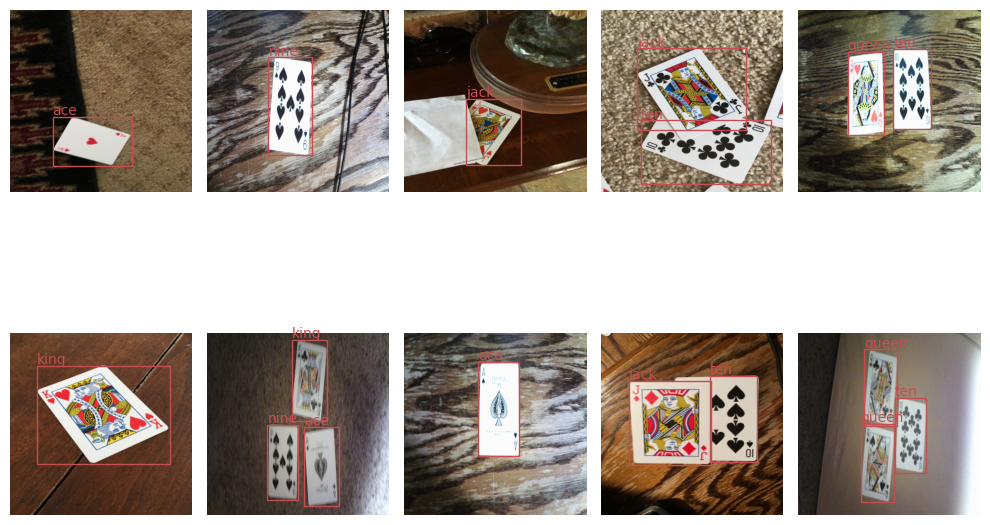

In [ ]:
out = [train_ds[i] for i in range(10)]
visualize([o["image"] for o in out], [o["bboxes"] for o in out])
